# EDA

In [1]:
import pandas as pd
import numpy as np
from datetime import date

# For heatmap generation
import folium
import json
from folium import plugins

## Import the Data

In [2]:
# Read in the review and business files
review = pd.read_csv('review.csv')
business = pd.read_csv('business.csv')

In [3]:
# View the review data in ascending order by date
review.sort_values(by=['date'])

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4179799,IykJMMZgbNcUndwf1q6ieg,3zBJUlWtPNoZ0uN83ODbyg,2bXm0SynOfxDzfrdrCyXqg,4,0,0,0,It's not chicago style pizza but it is still a...,2005-02-16 03:23:22
6295220,-O5ng1XLox6uEr4uIZ8u5A,3zBJUlWtPNoZ0uN83ODbyg,3g6XqkBikTTbZmTukbeGnw,4,1,0,0,Great service. The people really want to help...,2005-02-16 03:29:39
4887456,g80vzN72iU03Wh0fSpq41g,3zBJUlWtPNoZ0uN83ODbyg,PP3BBaVxZLcJU54uP_wL6Q,5,0,0,0,These guys really are the king of cheese steak...,2005-02-16 04:06:26
1423159,7Dcrt0Oz0hikA8obGhadrQ,XCsZ3hWa_6oP1WkWvK7pmg,U3grYFIeu6RgAAQgdriHww,5,0,0,0,Words cannot describe how much I miss this pla...,2005-03-01 16:57:17
4884223,WC9q5vhQlQkLK05kEs-vYQ,XCsZ3hWa_6oP1WkWvK7pmg,Aes-0Q_guDeYewMapFs_vg,2,0,0,0,Food is decent but is a complete tourist trap....,2005-03-01 16:59:37
...,...,...,...,...,...,...,...,...,...
4878781,11yPqFYtkACY7TWKc5MNzA,lmiiFd9KC15fs4xtEoXRvw,XDMno4l95AXgYOd0yDtHZA,5,0,0,0,Such yummy food and great customer service! I ...,2022-01-19 19:48:13
2710116,L0KaPI67DcTN4wwqfz6A3w,2Mb0st9WVyccaz6sKNLHWw,M88FFZZ2o_7QKpCFA_8RtA,5,0,0,0,I LOVE Subaru of Cherry Hill. I have bought n...,2022-01-19 19:48:16
6251618,3wqrZowVYwSPEh8p5nLn1g,3TQKP7KlNRdrI2gOkG7slg,jVg-KTXEFIeAq47DTp4Hrw,5,0,0,0,Jerry did an excellent job! My car is running ...,2022-01-19 19:48:19
5476035,gUkdqUCMJCJ38HVlLZxlgg,i1PMqye40QWNkJ0MYGHuzg,J0joPXxmN-_9Lzafspqdbw,5,0,0,0,Love love love this place! Great food and alwa...,2022-01-19 19:48:25


Note: The review dataset contains nearly 7 million reviews from 2/16/05 - 1/19/22.

In [4]:
# Check for missing values in Review
review.isnull().sum()

review_id      0
user_id        0
business_id    0
stars          0
useful         0
funny          0
cool           0
text           0
date           0
dtype: int64

Note: No missing values exist in the review data set.

In [5]:
# View business data
business

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",NaN
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471658,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150341,IUQopTMmYQG-qRtBk-8QnA,Binh's Nails,3388 Gateway Blvd,Edmonton,AB,T6J 5H2,53.468419,-113.492054,3.0,13,1,"{'ByAppointmentOnly': 'False', 'RestaurantsPri...","Nail Salons, Beauty & Spas","{'Monday': '10:0-19:30', 'Tuesday': '10:0-19:3..."
150342,c8GjPIOTGVmIemT7j5_SyQ,Wild Birds Unlimited,2813 Bransford Ave,Nashville,TN,37204,36.115118,-86.766925,4.0,5,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Pets, Nurseries & Gardening, Pet Stores, Hobby...","{'Monday': '9:30-17:30', 'Tuesday': '9:30-17:3..."
150343,_QAMST-NrQobXduilWEqSw,Claire's Boutique,"6020 E 82nd St, Ste 46",Indianapolis,IN,46250,39.908707,-86.065088,3.5,8,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Shopping, Jewelry, Piercing, Toy Stores, Beaut...",NaN
150344,mtGm22y5c2UHNXDFAjaPNw,Cyclery & Fitness Center,2472 Troy Rd,Edwardsville,IL,62025,38.782351,-89.950558,4.0,24,1,"{'BusinessParking': ""{'garage': False, 'street...","Fitness/Exercise Equipment, Eyewear & Optician...","{'Monday': '9:0-20:0', 'Tuesday': '9:0-20:0', ..."


Note: The business dataset contains 150,346 businesses with name, address, averag star rating, cumulative number of reviews, operating status, and attributes.

In [6]:
# Check for missing values in Business
business.isnull().sum()

business_id         0
name                0
address          5127
city                0
state               0
postal_code        73
latitude            0
longitude           0
stars               0
review_count        0
is_open             0
attributes      13744
categories        103
hours           23223
dtype: int64

Note: We have missing address, postal_code, attributes, categories, and hours data.  
Since Latitude and Longitude serve as precise location data, postal_code and address will be dropped.  
We have little interested in attributes, categories, or hours of operation, so they will also be dropped.  

In [7]:
# Drop unnecessary columns
business = business.drop(columns=['address', 'postal_code', 'attributes', 'categories', 'hours'])

## Chipotle-focused Overview

In [8]:
# subset all the chipotle restaurants from the business data set
chipotle = business[business['name'].str.contains("Chipotle")]
chipotle

,business_id,name,city,state,latitude,longitude,stars,review_count,is_open
153,aNtKyc2rr-uK5cqzY9TVQQ,Chipotle Mexican Grill,Largo,FL,27.894167,-82.779866,3.0,19,1
2563,AmnnsJq4Pz1jJUFzHwtsOA,Chipotle Mexican Grill,Indianapolis,IN,39.912878,-86.134275,3.0,65,1
2898,UCCc31J4N8Y57RuzmInjyw,Chipotle Mexican Grill,Plainfield,IN,39.713921,-86.355953,3.0,35,1
3008,C3Nc7EUqo64jRPWPn6vY9w,Chipotle Mexican Grill,Cherry Hill,NJ,39.927440,-75.031876,2.5,73,1
4891,2wEnpf2eu98rcYc540UN3Q,Chipotle Mexican Grill,Tucson,AZ,32.288873,-110.974068,3.5,14,0
...,...,...,...,...,...,...,...,...,...
147923,uupdI7jlavQBKXme3NS6cA,Chipotle Mexican Grill,Nashville,TN,36.111349,-86.766698,1.5,65,1
148584,9X_Sh8wiS1oiXq1klrJmxw,Chipotle Mexican Grill,Tampa,FL,28.063587,-82.503381,3.0,87,1
149522,IZuborFfCX6E6CVDWorHnw,Chipotle Mexican Grill,Boise,ID,43.612668,-116.203094,2.5,50,1
149684,27eH5ZI6JvEIW66QadM8EA,Chipotle Mexican Grill,Nashville,TN,36.132767,-86.894461,2.0,51,1


Note: There are 157 Chipotle locations within our data set.

In [9]:
# Create a list of chipotle business id's to pull the Chipotle reviews from the review data set
chipotle_list = chipotle['business_id'].tolist()

In [10]:
# Subset chipotle reviews
chipotle_review = review[review['business_id'].isin(chipotle_list)]
chipotle_review

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
93,onlgwy5qGDEzddsrnIvtWg,pYXeL0RCqus2IfhthYCOyA,W7NxQw8UYFR0HLPrI08tvw,4,0,0,0,Don't know what it is but If my tummy's feelin...,2012-02-01 14:21:25
993,V8dVnEHMdDNxCX6yFFam2Q,HjMKmLryj5emWPXcpBvt6Q,L7i_5DydYEKwPLfcDBRYDA,5,0,0,0,This Chipotle location was great! I wanted to ...,2017-05-13 14:09:53
1230,-xvk0ycCuDVq4qEalW2yCQ,9C48_ifO4fXBiHsfXebb1w,C3Nc7EUqo64jRPWPn6vY9w,3,0,0,0,"Well I did visit here a Year ago, long before ...",2016-05-07 01:53:33
1629,Ws1qBFGyxa-vnkUUnTd7uw,yJRFIA3-JOjOxLloejG1Jg,iAP8eZ847uCHLS-r81jUFg,5,1,0,3,I just recently moved to Idaho and today I wen...,2015-06-21 02:35:49
2757,batVbBszzQuw3LNR10pETw,BrhwZCoV-kd5JbV8G6gHLw,AmnnsJq4Pz1jJUFzHwtsOA,4,0,1,0,Can't believe I haven't tried Chipotle until t...,2013-06-24 07:38:03
...,...,...,...,...,...,...,...,...,...
6987083,C9JZlLiLTdL5XIPlFgBofA,BPAvbCjrf7xkGlYyuOd0sA,9X_Sh8wiS1oiXq1klrJmxw,1,0,0,0,Not happy with whoever took my order this afte...,2015-12-11 00:19:36
6987724,ETiOMt5X2DcasfiJVe60_w,2C8wxBF5uwcSYnV5LURDcA,Un6UO11mgLC6oRgozaJAKw,4,0,0,0,I love Chipotle so much no matter which store ...,2015-12-27 20:21:43
6988237,d15JKLZ4lh5UnZ63kLzs3A,Y-fPeP9dmciMYg83esNSWw,IZuborFfCX6E6CVDWorHnw,4,0,0,1,Hello there chicken burrito with extra pico an...,2017-06-07 17:49:49
6989454,tEL0cTGZRFLjBPY8TpLnmQ,BUS2Fu9UVlaPRZ97t0HPNQ,o8XwYGCtUi-emGSxTkOECQ,2,1,0,0,Literally the worst chipotle I have ever been ...,2021-04-13 23:11:24


In [11]:
# Merge location specific business information with review information for Chipotle restaurants
chipotle_full = chipotle_review.merge(chipotle[["state", "latitude", "longitude", "business_id"]], how='left', on='business_id')

In [12]:
# Sort by dates to see range of dates covered
chipotle_full.sort_values(by=['date'])

,review_id,user_id,business_id,stars,useful,funny,cool,text,date,state,latitude,longitude
5810,5AvnCsNOeprUUIz14904Vg,7_cyx6mQQIeOqa0MORcgZQ,G3qHuySzimTTf1_6uBxF2g,5,1,0,0,"Yes, I know it's another chain. Chipotle gets...",2007-07-04 12:33:45,IN,39.912180,-86.218402
8119,uG3qmcT9Lw_N5iB72Fi-HA,235W87YggWprtBY9jKXQTg,T6pMNyBC9ouFV2Msdvybgw,1,1,0,0,Initially we liked this fast food restaurant w...,2007-07-14 21:00:18,FL,27.947478,-82.523953
456,bgjIKYM0Xfc76vEIjuNqpw,yi41RzjWyGNPPwdL7Ln6IQ,W7NxQw8UYFR0HLPrI08tvw,3,0,2,0,I asked for a side of guacamole. The cashier s...,2007-07-19 18:58:54,AZ,32.250019,-110.890925
1833,kbM4KUl9ZbopwU0OuwJK0w,lsYZlrgIoR6hTrzT-32rgQ,dgGuvdysSuWOv2dKqZTbVA,5,3,2,2,Although it may seem like I only give out 5 st...,2007-10-17 15:27:52,PA,40.007506,-75.212249
1512,80kkE0xd20Z1VD9P_yJRCw,g35P2UgyRK1ercs6rVkN1Q,dgGuvdysSuWOv2dKqZTbVA,5,3,0,3,Finally it is here. One of the only places i w...,2007-10-17 17:04:47,PA,40.007506,-75.212249
...,...,...,...,...,...,...,...,...,...,...,...,...
8287,8ld3EEQ64yo34eG1FxhTnA,cSKLV3CudAbHGW5GOHoRJQ,ztFGiRmX7HPoKMKbgkP17w,5,1,0,1,"The gold standard location, far greater result...",2022-01-18 22:06:25,IN,39.926396,-86.090340
6555,xEbA3iGsljScFieGXUN7WA,Uf1gF12WSQfYJFX-Hj1UnA,7jVmd4JBBIKjWdMyyre4kA,1,0,0,0,Worst run Chipotle I've ever been to. Trash o...,2022-01-19 01:25:39,FL,28.066466,-82.570508
4105,4lifxPjsA9tABoMYvNUdpQ,qHMPt-8ngnYLic3E_IRtAw,hAaS-9vvlw_UPEMqkMi7hQ,5,1,0,0,"Nice, fresh ingredients. I've never been disap...",2022-01-19 04:14:29,IN,39.638285,-86.129493
8316,m4y9Hk5Xz14zkEhaJsiFDg,lPEP0oZP8UXYnZDRHl6EZw,T6pMNyBC9ouFV2Msdvybgw,1,0,0,0,I have been to this Chipotle many times over t...,2022-01-19 10:41:53,FL,27.947478,-82.523953


In [13]:
# Descriptive Statistics of Chipotle_full
chipotle_full.describe()

,stars,useful,funny,cool,latitude,longitude
count,9771.000000,9771.000000,9771.000000,9771.000000,9771.000000,9771.000000
mean,2.477945,0.716815,0.258725,0.263535,36.059985,-87.408977
std,1.544363,2.248562,1.301992,1.748121,4.991983,14.416070
min,1.000000,0.000000,0.000000,0.000000,27.780137,-119.869406
25%,1.000000,0.000000,0.000000,0.000000,32.205961,-90.184479
50%,2.000000,0.000000,0.000000,0.000000,38.750697,-82.638743
75%,4.000000,1.000000,0.000000,0.000000,39.966856,-75.282959
max,5.000000,140.000000,80.000000,112.000000,43.671261,-74.875399


In [14]:
# Count the number of unique reviewers
chipotle_full.user_id.nunique()

8752

In [15]:
# Count the number of Chipotle locations with reviews
chipotle_full.business_id.nunique()

157

Note: We have 9,771 Chipotle reviews from 157 restaurants given by 8,752 unique reviewers with a mean star rating of 2.48 between 7/4/07 and 1/19/22.

In [16]:
# Count reviews by state for full period
chipotle_full.groupby(['state'])['text'].count()

state
AZ     745
CA     350
DE      76
FL    2035
ID     282
IL      67
IN     646
LA     265
MO     615
NJ     689
NV     423
PA    2686
TN     892
Name: text, dtype: int64

Note: Top 5 states with reviews are PA (2686), FL (2035), TN (892), AZ (745) and NJ (689) for all reviews between 7/4/07 and 1/19/22.

In [17]:
# Create a heat map of Chipotle locations for all reviews
with open('usMap.json') as f:
    usArea = json.load(f)

In [18]:
# Initialize the USA map
usMap = folium.Map(location=[37.0902,-95.7129], tiles='Stamen Toner', zoom_start=4)

# For each row in the Chipotle Review dataset, plot the corresponding latitude and longitude on the map
for i,row in chipotle_full.iterrows():
    folium.CircleMarker((row.latitude,row.longitude), radius=3, weight=2, color='red', fill_color='red', fill_opacity=.5).add_to(usMap)

usMap.add_child(plugins.HeatMap(data=chipotle_full[["latitude", "longitude"]].to_numpy(), radius=25, blur=10))

# Save the map as an html
#usMap.save('usHeatmap.html')

# Display the map
usMap

In [19]:
# Ensure date is set as datetime type
chipotle_full['date'] = pd.to_datetime(chipotle_full["date"])

In [20]:
# Create new column with date only (no time)
chipotle_full['day_date'] = pd.to_datetime(chipotle_full["date"]).dt.date

In [21]:
full_chipotle_data = pd.crosstab(chipotle_full.day_date, chipotle_full.stars)
full_chipotle_data

stars,1,2,3,4,5
day_date,,,,,
2007-07-04,0,0,0,0,1
2007-07-14,1,0,0,0,0
2007-07-19,0,0,1,0,0
2007-10-17,0,0,0,0,2
2007-10-24,0,0,0,0,1
...,...,...,...,...,...
2022-01-15,9,0,0,0,0
2022-01-16,2,0,0,0,0
2022-01-17,3,0,0,0,1


In [22]:
# Calculate the number of days within our date range for understanding of coverage

f_date = date(2007, 7, 4)
l_date = date(2022, 1, 19)
delta = l_date - f_date
print(delta.days)

5313


Note: We have 0 reviews for 1790 days or 34% (1790/5313) of the full date range. Since we focused on the events, a more thorough analysis of missing dates was explored in the subset data.

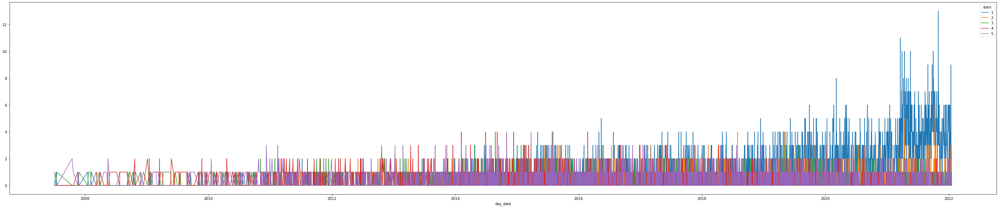

In [23]:
# Creating line plot
lineplot = full_chipotle_data.plot.line(figsize=(50, 10))

Note: Star ratings for the entire period are difficult to interpret; however, we do see an increase in the number of ratings over time and a significant increase in 1-star ratings beginning in 2015 that is amplified as we approach 2020 and beyond. Since we are more interested in the period before, during, and after the 2015-2016 foodborne illness crisis, we initially subset the data from 1/1/2015 - 12/31/2017.

In [24]:
# Beginning of the year to the event (Jan-Sept), the event (oct - Feb), after the event
mask = (chipotle_full['date'] > '2015-01-01') & (chipotle_full['date'] <= '2017-12-31')
chip_2015_2017 = chipotle_full.loc[mask]

In [25]:
chip_2015_2017

,review_id,user_id,business_id,stars,useful,funny,cool,text,date,state,latitude,longitude,day_date
1,V8dVnEHMdDNxCX6yFFam2Q,HjMKmLryj5emWPXcpBvt6Q,L7i_5DydYEKwPLfcDBRYDA,5,0,0,0,This Chipotle location was great! I wanted to ...,2017-05-13 14:09:53,NJ,39.853151,-74.982540,2017-05-13
2,-xvk0ycCuDVq4qEalW2yCQ,9C48_ifO4fXBiHsfXebb1w,C3Nc7EUqo64jRPWPn6vY9w,3,0,0,0,"Well I did visit here a Year ago, long before ...",2016-05-07 01:53:33,NJ,39.927440,-75.031876,2016-05-07
3,Ws1qBFGyxa-vnkUUnTd7uw,yJRFIA3-JOjOxLloejG1Jg,iAP8eZ847uCHLS-r81jUFg,5,1,0,3,I just recently moved to Idaho and today I wen...,2015-06-21 02:35:49,ID,43.624164,-116.353787,2015-06-21
6,HdTUAwNaPQ_vzMiwVdsmiA,7vBKUEJYDr24p3uJ6reAVg,L7i_5DydYEKwPLfcDBRYDA,1,0,0,0,WORST location out there. I eat Chipotle 4+ t...,2016-10-26 17:46:13,NJ,39.853151,-74.982540,2016-10-26
7,54kBINwBwrymR7eCynYQkA,Mq1kV9Rxhxd1DFckBUOabg,bKgyXSQUGA8IHGt8ne5NuA,5,0,0,0,Went here today with my family and I must say ...,2015-12-21 08:16:29,NV,39.477469,-119.793162,2015-12-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9743,vavuS76Zn-QgMSGaB_N2wQ,ceFHavITrot4UAW5DG54tA,27eH5ZI6JvEIW66QadM8EA,5,4,3,4,A new location up the hill. We are becoming r...,2016-12-12 13:53:56,TN,36.132767,-86.894461,2016-12-12
9754,PwXxOqSJ82ybgQJwi1OiDw,NFeNXGbZWRCe6qMEppNdRw,qjtELTt9fdIwoi_xGNN21g,3,3,1,1,This location is closest to me so when I am fe...,2015-10-19 13:46:30,NJ,39.943481,-74.964743,2015-10-19
9766,C9JZlLiLTdL5XIPlFgBofA,BPAvbCjrf7xkGlYyuOd0sA,9X_Sh8wiS1oiXq1klrJmxw,1,0,0,0,Not happy with whoever took my order this afte...,2015-12-11 00:19:36,FL,28.063587,-82.503381,2015-12-11
9767,ETiOMt5X2DcasfiJVe60_w,2C8wxBF5uwcSYnV5LURDcA,Un6UO11mgLC6oRgozaJAKw,4,0,0,0,I love Chipotle so much no matter which store ...,2015-12-27 20:21:43,PA,40.047876,-75.058251,2015-12-27


In [26]:
# Descriptive Statistics
chip_2015_2017.describe()

,stars,useful,funny,cool,latitude,longitude
count,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000
mean,2.718270,0.710404,0.270290,0.258849,35.712582,-87.220868
std,1.544985,1.535166,0.985166,1.076241,5.138928,14.008119
min,1.000000,0.000000,0.000000,0.000000,27.780137,-119.869406
25%,1.000000,0.000000,0.000000,0.000000,29.960017,-90.184479
50%,2.000000,0.000000,0.000000,0.000000,38.672663,-82.638834
75%,4.000000,1.000000,0.000000,0.000000,39.954101,-75.333771
max,5.000000,35.000000,25.000000,25.000000,43.671261,-74.914031


In [27]:
# Count the number of unique reviewers
chip_2015_2017.user_id.nunique()

2571

In [28]:
# Count the number of Chipotle locations with reviews
chip_2015_2017.business_id.nunique()

124

Note: We have 2,797 Chipotle reviews from 124 of the 157 resturants given by 2,571 unique reviewers with a mean star rating of 2.72 between 1/1/2015 and 12/31/17.

In [29]:
# Count reviews by state for 2015-2017
chip_2015_2017.groupby(['state'])['text'].count()

state
AZ    222
CA     81
DE     25
FL    653
ID     62
IL     16
IN    219
LA    106
MO    170
NJ    164
NV    125
PA    753
TN    201
Name: text, dtype: int64

In [30]:
# Calculate mean star rating by state for 2015-2017
chip_2015_2017.groupby(['state'])['stars'].mean()

state
AZ    3.072072
CA    2.506173
DE    1.720000
FL    2.509954
ID    3.096774
IL    3.125000
IN    3.219178
LA    2.820755
MO    3.241176
NJ    2.804878
NV    3.304000
PA    2.414343
TN    2.726368
Name: stars, dtype: float64

Note: Top 5 states with Chipotle reviews are PA (753), FL (653), AZ (222), IN (219), and TN (201) between 1/1/2015 and 12/31/2016.

Notes on the 2015-2016 Foodborne Illness crisis:  
- Seattle (WA) E.Coli Outbreak  
- California E. Coli Outbreak  
- Minnesota Salmonella Outbreak  
- Boston (ME) Norovirus Outbreak  
- 11-state E. Coli Outbreak (WA, OR, CA, MN, IL, KY, OH, PA, NY, MD)  
  
Unfortunately, the Yelp Academic dataset does not contain Chipotle reviews for all states involved; however, we have reviews from adjacent states for all but WA and MN.  
  
Coverage:    
- We have 0 reviews from WA, MN, ME, OR, KY, OH, NY, DE, MD (impacted states) locations.  
- We have 753 review from PA but only 81 for CA, 25 for DE, and 16 for IL.  
- Additionally,we have 222 from AZ and 125 from NV which are CA adjacent, 164 from NJ which is NY adjacent, 62 from ID which is WA & OR adjacent, PA is OH, NY, DE, & MD adjancent, DE is MD adjacent, MO (170) is IL and KY adjacent, IN (219) is OH & KY adjacent, TN (201) is KY adjacent, and CA is OR adjacent.  
  
Ratings by state:  
Impacted states:   
PA: 2.41  
CA: 2.51  
DE: 1.72  
IL: 3.12 (exception - only a single location)  

Adjacent States:  
AZ: 3.07  
NV: 3.30  
NJ: 2.80  
ID: 3.10
IN: 3.22
MO: 3.24
TN: 2.73

Non-impacted States:  
FL: 2.51  
LA: 2.82  


In all directly impacted states, excluding, IL, star ratings were significantly lower than the average for period of 2.72 and lower than at adjacent and non-impacted states.  The code below shows that all 16 ratings for IL are some a single location (Fairview Heights, IL). At the time of this study (11/10/22), this location had a 2.3 Yelp review rating.

In all adjacent states, excluding NJ & TN, we see significantly higher star ratings than the average for the period of 2.72.  

Interestingly, we see mixed results in the non-impacted states (FL &LA).  

In [31]:
# Investigate the IL anomaly
IL = chip_2015_2017[chip_2015_2017['state'].str.contains("IL")]
IL.sort_values(by=['date'])

,review_id,user_id,business_id,stars,useful,funny,cool,text,date,state,latitude,longitude,day_date
1541,j0w9ZU0qY_Ov1ehuaqN79Q,ePBUGXl0hsb8WykLJJB66A,kUP8plrgTC5f4-pQi-kvFg,1,0,0,0,Slowest Chipotle I've ever been to. It's lunch...,2015-03-10 17:30:06,IL,38.591916,-89.985523,2015-03-10
1488,_KPXqQQAj-fs855_L_K0Rw,IcowqfUjDSmdwtT0vp4pRg,kUP8plrgTC5f4-pQi-kvFg,4,1,0,0,I love chipotle!!! I usually order the barbaco...,2015-03-24 21:59:29,IL,38.591916,-89.985523,2015-03-24
1701,GVVreX69RuBBlgZQyr6UPA,uz1yw-PKSCYrtHk1y_Z3XA,kUP8plrgTC5f4-pQi-kvFg,4,0,0,0,Consistently good food. Socially responsible b...,2015-06-20 19:58:34,IL,38.591916,-89.985523,2015-06-20
1469,1ZlrC0-KDt88dLc2OGe1jg,8YO9LF7O3R4X78XhzzUB5Q,kUP8plrgTC5f4-pQi-kvFg,1,1,0,0,"Service: maybe it's the Midwest, but they were...",2015-06-26 22:46:35,IL,38.591916,-89.985523,2015-06-26
1905,EbatbL5xkyaun2Z_n-0ddA,OxsSRhMIwvs3tV4gX4vwow,kUP8plrgTC5f4-pQi-kvFg,5,0,0,0,Always accommodating. Fresh yummy food. Plus t...,2015-07-02 15:07:33,IL,38.591916,-89.985523,2015-07-02
1837,F_YEP83lCiSg3sMH4mDLyg,CQd0Y6FMi7NXTt73XsoRhg,kUP8plrgTC5f4-pQi-kvFg,3,1,0,0,Was a fav of the family for a long time...... ...,2015-07-28 01:12:35,IL,38.591916,-89.985523,2015-07-28
1342,aM-YrzsVsB6v30iPD1ZVWg,1hO3OvXcuU1N-zVXCqdFiA,kUP8plrgTC5f4-pQi-kvFg,5,0,0,0,Healthy and delicious fast food that is social...,2015-08-21 01:15:55,IL,38.591916,-89.985523,2015-08-21
1270,tkRafZQQCiy-b5wPaDWknQ,Q-IyqHiLAQiwxJBcAtJr8Q,kUP8plrgTC5f4-pQi-kvFg,4,0,0,0,Great food. Very good quality and value. Pleas...,2015-08-21 15:39:08,IL,38.591916,-89.985523,2015-08-21
2069,V5xmjJv7lmKPZ2GAPOFk8A,hwx7-sjfWpd6G83lNIp7Tw,kUP8plrgTC5f4-pQi-kvFg,1,0,0,0,What Happened? Usually the food at this locat...,2015-09-09 22:59:54,IL,38.591916,-89.985523,2015-09-09
1274,5g-qofvGZW8r-4Q1x_p3Lw,-v2IPgrUSp3ZPvwLvLFAYg,kUP8plrgTC5f4-pQi-kvFg,2,1,0,0,Very slow service when we went. The line snak...,2015-09-12 12:19:58,IL,38.591916,-89.985523,2015-09-12


In [32]:
# Find the number of locations = 1
IL.business_id.nunique()

1

In [33]:
# Create a crosstab view of 2015-2017 star ratings per day
crosstb = pd.crosstab(chip_2015_2017.day_date, chip_2015_2017.stars)
crosstb

stars,1,2,3,4,5
day_date,,,,,
2015-01-01,0,0,1,1,0
2015-01-02,1,0,0,0,0
2015-01-03,3,0,0,1,0
2015-01-04,0,1,0,0,0
2015-01-05,0,0,0,2,0
...,...,...,...,...,...
2017-12-26,0,0,0,2,0
2017-12-27,1,0,0,0,2
2017-12-28,2,0,1,0,0


In [34]:
# Calculate the number of days within our date range for understanding of coverage

f_date = date(2015, 1, 1)
l_date = date(2017, 12, 31)
delta = l_date - f_date
print(delta.days)

1095


Note: We have review data for 998 of the 1095 days (91%) in our subset time period.

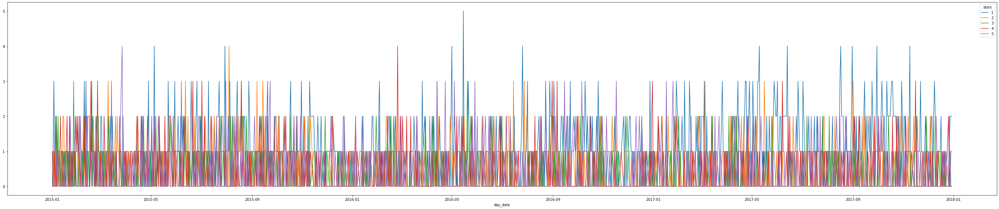

In [35]:
# Plot 2015-2017 star ratings per day
lineplot = crosstb.plot.line(figsize=(50, 10))

Note: While this graphic is difficult to visually inspecat, we see spikes in 1-star ratings near May 2015, followeded by elevated 1-star ratings and a subsequent spike near Aug 2015 (Outbreak) followed by elevated 1-star ratings. We also not an time period peak/spike near June of 2016, followed by a spike in Aug 2016. In 2017, we see several spikes in 1 star-ratings.

In [36]:
# Sort Crosstab by descending order of 1-star ratings - view top 20
crosstb.sort_values(by=1, ascending=False).head(20)

stars,1,2,3,4,5
day_date,,,,,
2016-05-15,5,0,2,2,2
2017-05-10,4,0,0,1,0
2017-09-30,4,0,1,0,0
2017-08-17,4,1,0,0,0
2017-06-13,4,0,0,0,0
2016-05-01,4,0,0,0,0
2017-11-09,4,0,1,0,0
2017-08-31,4,1,1,0,0
2015-05-05,4,0,0,2,2


In [37]:
# Sort Crosstab by descending order of 1-star ratings - view bottom 20
crosstb.sort_values(by=1, ascending=False).tail(20)

stars,1,2,3,4,5
day_date,,,,,
2016-09-29,0,1,0,0,1
2015-05-15,0,1,0,0,0
2016-09-23,0,1,0,0,0
2016-09-21,0,0,0,0,2
2016-09-20,0,1,0,0,0
2015-05-18,0,1,0,2,0
2016-09-16,0,0,1,1,1
2016-09-15,0,0,0,1,3
2016-09-14,0,0,2,1,0


In [38]:
# Let's investigate the directly impacted states (except IL since only 1 location is captured)
impacted_2015_2017 = chip_2015_2017[chip_2015_2017['state'].str.contains("PA|CA|DE")]

In [39]:
impacted_2015_2017.describe()

,stars,useful,funny,cool,latitude,longitude
count,859.000000,859.000000,859.000000,859.000000,859.000000,859.000000
mean,2.402794,0.777648,0.306170,0.208382,39.504873,-79.463187
std,1.464671,1.430003,0.847647,0.739889,1.642114,13.023221
min,1.000000,0.000000,0.000000,0.000000,34.419029,-119.869406
25%,1.000000,0.000000,0.000000,0.000000,39.948710,-75.432015
50%,2.000000,0.000000,0.000000,0.000000,40.009613,-75.241937
75%,4.000000,1.000000,0.000000,0.000000,40.088299,-75.160691
max,5.000000,14.000000,10.000000,8.000000,40.323448,-74.964648


In [40]:
# Create a crosstab view of impacted states 2015-2017 star ratings per day
crosstb_impact = pd.crosstab(impacted_2015_2017.day_date, impacted_2015_2017.stars)
crosstb_impact

stars,1,2,3,4,5
day_date,,,,,
2015-01-01,0,0,1,0,0
2015-01-03,1,0,0,0,0
2015-01-05,0,0,0,1,0
2015-01-06,1,0,0,0,0
2015-01-07,0,1,0,0,0
...,...,...,...,...,...
2017-12-10,1,0,0,0,0
2017-12-11,0,0,0,0,1
2017-12-14,0,1,0,1,0


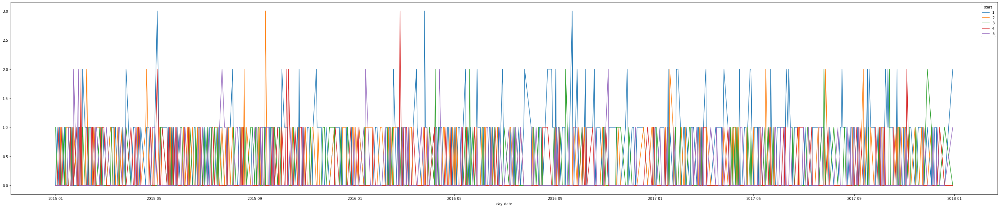

In [41]:
# Plot impacted states 2015-2017 star ratings per day
lineplot = crosstb_impact.plot.line(figsize=(50, 10))

Note: To remove some granularity from our data set, we will use Year_Week (week number in the year) to combine data from a week in the hopes it provides a smoother/clearer depictionimpacted_2015_2017ppening.

In [42]:
# Add Week of the Year to bin daily review into weekly reviews
chip_2015_2017['Year_Week'] = pd.to_datetime(chip_2015_2017['day_date']).dt.strftime('%Y-%U')

<ipython-input-42-98d351943952>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chip_2015_2017['Year_Week'] = pd.to_datetime(chip_2015_2017['day_date']).dt.strftime('%Y-%U')


In [43]:
crosstb_week = pd.crosstab(chip_2015_2017.Year_Week, chip_2015_2017.stars)
crosstb_week

stars,1,2,3,4,5
Year_Week,,,,,
2015-00,4,0,1,2,0
2015-01,6,3,5,5,2
2015-02,3,6,3,3,2
2015-03,4,1,3,5,2
2015-04,4,2,4,6,4
...,...,...,...,...,...
2017-48,5,2,2,1,2
2017-49,9,3,4,2,1
2017-50,5,2,2,3,3


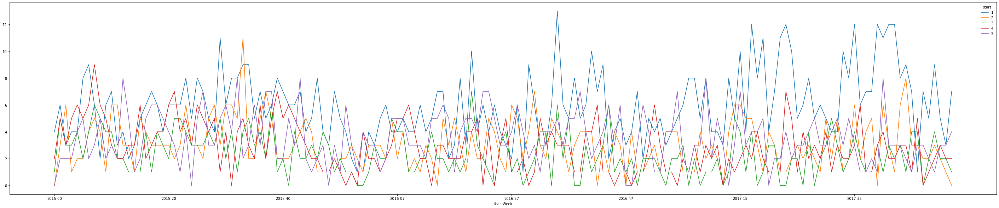

In [44]:
# Creating line plot
lineplot2 = crosstb_week.plot.line(figsize=(50, 10))

In [45]:
# Let's investigate the directly impacted states (except IL since only 1 location is captured)
impacted_2015_2017 = chip_2015_2017[chip_2015_2017['state'].str.contains("PA|CA|DE")]

# Create a crosstab view of impacted states 2015-2017 star ratings per day
crosstb_impact_week = pd.crosstab(impacted_2015_2017.Year_Week, impacted_2015_2017.stars)
crosstb_impact_week

stars,1,2,3,4,5
Year_Week,,,,,
2015-00,1,0,1,0,0
2015-01,1,1,1,2,0
2015-02,2,3,1,0,1
2015-03,3,1,2,2,2
2015-04,3,0,1,2,3
...,...,...,...,...,...
2017-48,1,0,2,0,0
2017-49,2,1,1,0,1
2017-50,1,1,0,1,1


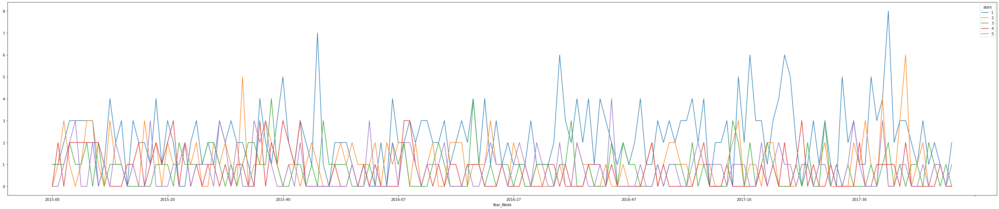

In [46]:
# Plot impacted states 2015-2017 star ratings per day
lineplot_impact_week = crosstb_impact_week.plot.line(figsize=(50, 10))

In [47]:

#Let's group 1&2 = negative , 3=neutral, 4&5 = positive based on stars

# create a list of our conditions
conditions = [
    (chip_2015_2017['stars'] <= 2),
    (chip_2015_2017['stars'] == 3),
    (chip_2015_2017['stars'] >= 4)]

# create a list of the values we want to assign for each condition
values = ['negative', 'neutral', 'positive']

# create a new column and use np.select to assign values to it using our lists as arguments
chip_2015_2017['crude_sentiment'] = np.select(conditions, values)

# display updated DataFrame
chip_2015_2017.head()

<ipython-input-47-cc0892d5a798>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chip_2015_2017['crude_sentiment'] = np.select(conditions, values)


,review_id,user_id,business_id,stars,useful,funny,cool,text,date,state,latitude,longitude,day_date,Year_Week,crude_sentiment
1,V8dVnEHMdDNxCX6yFFam2Q,HjMKmLryj5emWPXcpBvt6Q,L7i_5DydYEKwPLfcDBRYDA,5,0,0,0,This Chipotle location was great! I wanted to ...,2017-05-13 14:09:53,NJ,39.853151,-74.982540,2017-05-13,2017-19,positive
2,-xvk0ycCuDVq4qEalW2yCQ,9C48_ifO4fXBiHsfXebb1w,C3Nc7EUqo64jRPWPn6vY9w,3,0,0,0,"Well I did visit here a Year ago, long before ...",2016-05-07 01:53:33,NJ,39.927440,-75.031876,2016-05-07,2016-18,neutral
3,Ws1qBFGyxa-vnkUUnTd7uw,yJRFIA3-JOjOxLloejG1Jg,iAP8eZ847uCHLS-r81jUFg,5,1,0,3,I just recently moved to Idaho and today I wen...,2015-06-21 02:35:49,ID,43.624164,-116.353787,2015-06-21,2015-25,positive
6,HdTUAwNaPQ_vzMiwVdsmiA,7vBKUEJYDr24p3uJ6reAVg,L7i_5DydYEKwPLfcDBRYDA,1,0,0,0,WORST location out there. I eat Chipotle 4+ t...,2016-10-26 17:46:13,NJ,39.853151,-74.982540,2016-10-26,2016-43,negative
7,54kBINwBwrymR7eCynYQkA,Mq1kV9Rxhxd1DFckBUOabg,bKgyXSQUGA8IHGt8ne5NuA,5,0,0,0,Went here today with my family and I must say ...,2015-12-21 08:16:29,NV,39.477469,-119.793162,2015-12-21,2015-51,positive


In [48]:
crosstb_grouped = pd.crosstab(chip_2015_2017.Year_Week, chip_2015_2017.crude_sentiment)
crosstb_grouped

crude_sentiment,negative,neutral,positive
Year_Week,,,
2015-00,4,1,2
2015-01,9,5,7
2015-02,9,3,5
2015-03,5,3,7
2015-04,6,4,10
...,...,...,...
2017-48,7,2,3
2017-49,12,4,3
2017-50,7,2,6


In [49]:
crosstb_grouped.sort_values(by='negative', ascending=False).head(20)

crude_sentiment,negative,neutral,positive
Year_Week,,,
2015-33,20,4,7
2017-35,18,4,6
2017-40,17,1,12
2017-17,17,4,6
2017-44,17,1,5
2016-35,17,6,8
2017-15,16,4,9
2017-41,15,3,5
2015-23,14,4,9


Peak: 2015 Week 33 = Week of Aug = same time as our outbreaks

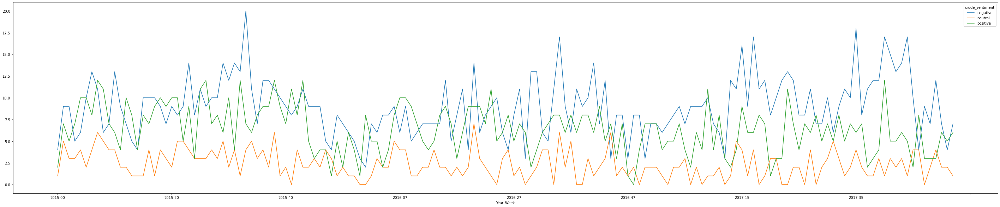

In [50]:
# Creating line plot
lineplot3 = crosstb_grouped.plot.line(figsize=(50, 10))

In [51]:
# Checking the average values for 2015-2016
mask2 = (chipotle_full['date'] > '2015-01-01') & (chipotle_full['date'] <= '2016-12-31')
Chipotle_2015_2016 = chipotle_full.loc[mask2]

In [52]:
crosstb_day = pd.crosstab(Chipotle_2015_2016.day_date, Chipotle_2015_2016.stars)
crosstb_day

stars,1,2,3,4,5
day_date,,,,,
2015-01-01,0,0,1,1,0
2015-01-02,1,0,0,0,0
2015-01-03,3,0,0,1,0
2015-01-04,0,1,0,0,0
2015-01-05,0,0,0,2,0
...,...,...,...,...,...
2016-12-24,1,0,0,1,0
2016-12-27,0,0,1,0,0
2016-12-28,3,1,0,1,0


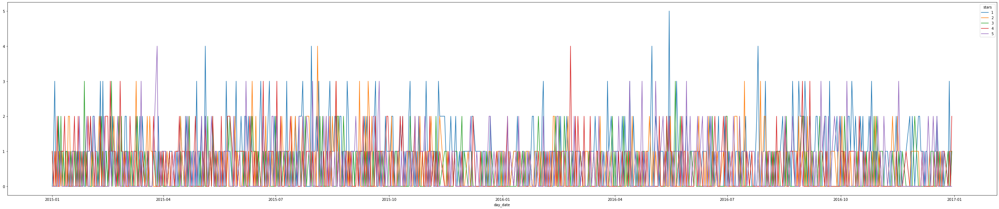

In [53]:
# Creating line plot
lineplot = crosstb_day.plot.line(figsize=(50, 10))

In [54]:
Chipotle_2015_2016['Year_Week'] = pd.to_datetime(Chipotle_2015_2016['day_date']).dt.strftime('%Y-%U')

<ipython-input-54-4dbed3514df2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Chipotle_2015_2016['Year_Week'] = pd.to_datetime(Chipotle_2015_2016['day_date']).dt.strftime('%Y-%U')


In [55]:
crosstb_week = pd.crosstab(Chipotle_2015_2016.Year_Week, Chipotle_2015_2016.stars)
crosstb_week

stars,1,2,3,4,5
Year_Week,,,,,
2015-00,4,0,1,2,0
2015-01,6,3,5,5,2
2015-02,3,6,3,3,2
2015-03,4,1,3,5,2
2015-04,4,2,4,6,4
...,...,...,...,...,...
2016-48,4,4,2,0,0
2016-49,7,1,0,1,3
2016-50,2,1,2,1,6


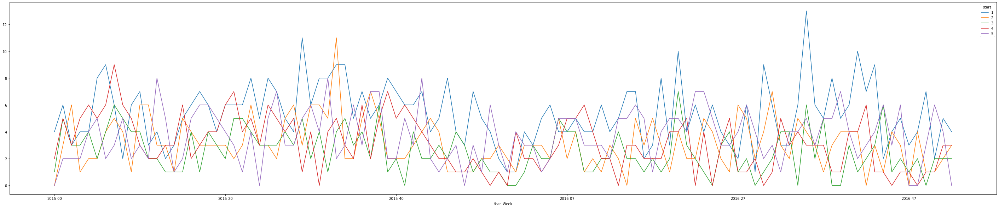

In [56]:
# Creating line plot
lineplot2 = crosstb_week.plot.line(figsize=(50, 10))

In [57]:
# Count reviews by state
Chipotle_2015_2016.groupby(['state'])['text'].count()

state
AZ    154
CA     56
DE      8
FL    458
ID     46
IL     15
IN    144
LA     92
MO    124
NJ    109
NV     77
PA    508
TN    102
Name: text, dtype: int64

In [58]:

#Let's group 1&2 = negative , 3=neutral, 4&5 = positive based on stars

# create a list of our conditions
conditions = [
    (Chipotle_2015_2016['stars'] <= 2),
    (Chipotle_2015_2016['stars'] == 3),
    (Chipotle_2015_2016['stars'] >= 4)]

# create a list of the values we want to assign for each condition
values = ['negative', 'neutral', 'positive']

# create a new column and use np.select to assign values to it using our lists as arguments
Chipotle_2015_2016['crude_sentiment'] = np.select(conditions, values)

# display updated DataFrame
Chipotle_2015_2016.head()

<ipython-input-58-98b9350f4d8e>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Chipotle_2015_2016['crude_sentiment'] = np.select(conditions, values)


,review_id,user_id,business_id,stars,useful,funny,cool,text,date,state,latitude,longitude,day_date,Year_Week,crude_sentiment
2,-xvk0ycCuDVq4qEalW2yCQ,9C48_ifO4fXBiHsfXebb1w,C3Nc7EUqo64jRPWPn6vY9w,3,0,0,0,"Well I did visit here a Year ago, long before ...",2016-05-07 01:53:33,NJ,39.927440,-75.031876,2016-05-07,2016-18,neutral
3,Ws1qBFGyxa-vnkUUnTd7uw,yJRFIA3-JOjOxLloejG1Jg,iAP8eZ847uCHLS-r81jUFg,5,1,0,3,I just recently moved to Idaho and today I wen...,2015-06-21 02:35:49,ID,43.624164,-116.353787,2015-06-21,2015-25,positive
6,HdTUAwNaPQ_vzMiwVdsmiA,7vBKUEJYDr24p3uJ6reAVg,L7i_5DydYEKwPLfcDBRYDA,1,0,0,0,WORST location out there. I eat Chipotle 4+ t...,2016-10-26 17:46:13,NJ,39.853151,-74.982540,2016-10-26,2016-43,negative
7,54kBINwBwrymR7eCynYQkA,Mq1kV9Rxhxd1DFckBUOabg,bKgyXSQUGA8IHGt8ne5NuA,5,0,0,0,Went here today with my family and I must say ...,2015-12-21 08:16:29,NV,39.477469,-119.793162,2015-12-21,2015-51,positive
8,Hny3Xeiu6kRLknHpaZLiCA,U53g03FvzB6yESJeU12CrA,9ouyziwYpSvJzlLFpukSgA,5,1,0,0,LOVE chiptole- all locations! this location ha...,2016-04-23 02:42:28,FL,27.838802,-82.684667,2016-04-23,2016-16,positive


In [59]:
crosstb_grouped = pd.crosstab(Chipotle_2015_2016.Year_Week, Chipotle_2015_2016.crude_sentiment)
crosstb_grouped

crude_sentiment,negative,neutral,positive
Year_Week,,,
2015-00,4,1,2
2015-01,9,5,7
2015-02,9,3,5
2015-03,5,3,7
2015-04,6,4,10
...,...,...,...
2016-48,8,2,0
2016-49,8,0,4
2016-50,3,2,7


In [60]:
crosstb_grouped.sort_values(by='negative', ascending=False).head(20)

crude_sentiment,negative,neutral,positive
Year_Week,,,
2015-33,20,4,7
2016-35,17,6,8
2016-20,14,7,9
2015-31,14,4,4
2015-29,14,5,6
2015-23,14,4,9
2016-41,14,1,6
2016-30,13,1,2
2015-10,13,4,6


Peak: 2015 Week 33 = Week of Aug 10

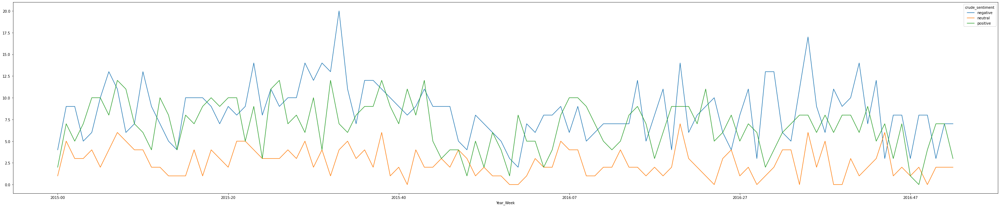

In [61]:
# Creating line plot
lineplot3 = crosstb_grouped.plot.line(figsize=(50, 10))